# Welcome to the clustering, models and insights codebase

### By following the next python code, you will be able to run and understand how the clusters, main insights, relevant variables' relations and analytical plots were constructed. We hope you find it easy to follow and replicate if you want.

## Import required libraries and establish a connection with RDS

The required libraries should be previously installed to the code works properly.

Also, the RDS engine should be running to be able to connect to the desired database.

In [11]:
import datetime
import missingno as msno
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,RandomForestRegressor
from sklearn.model_selection import train_test_split,RandomizedSearchCV
from sklearn import metrics
from sklearn import tree
from xgboost import XGBRegressor,XGBClassifier
import seaborn as sns
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import LabelBinarizer
import warnings
warnings.filterwarnings("ignore")
from sqlalchemy import create_engine, text
import scipy.stats as stats
#maximum number of rows to display
pd.options.display.max_rows = 20
import time
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import plotly.express as px
import matplotlib.gridspec as gridspec
import plotly.graph_objects as go
import plotly.figure_factory as ff
import statsmodels.api as sm

# Connect to the RDS using the provided credentials
DB_USERNAME = 'user'
DB_PASSWORD = '******' 
DB_ENDPOINT = 'ds4a-demo-instance.cqjr4hyu9xaq.us-east-1.rds.amazonaws.com' 
DB_NAME = 'desertion_pj_team67' 

# Connect to the RDS
engine=create_engine(f'postgresql://{DB_USERNAME}:{DB_PASSWORD}@{DB_ENDPOINT}/{DB_NAME}', max_overflow=20)

# Define function to run querys
def runQuery(sql):
    result = engine.connect().execution_options(isolation_level="AUTOCOMMIT").execute((text(sql)))
    return pd.DataFrame(result.fetchall(), columns=result.keys())

###  Retrieve data from RDS to pandas dataframe

The last data available (last year) is loaded. Afterwards, some variables that are in object format are converted to integer for future handling.

In [12]:
start_time = time.time()

#Get variables names
aux=runQuery("""select * from master_table_by_municipio limit 1;""")
all_vars=aux.columns

#Set variables per last available year
keep_vars_2016=['icbf_cobert_inmu_dtp_hep_1','icbf_cobert_inmu_tv_1','icbf_cobert_vacu_bcg_nac_v','icbf_cobert_vacu_fib_ama_1','icbf_cobert_vacu_haem_b_1','icbf_cobert_vacu_neumco_1','icbf_cobert_vacu_polio_1','icbf_cobert_vacu_rotav_1','icbf_num_afi_reg_contr_18','icbf_num_afi_reg_subs_18','icbf_num_nin_adol_desvinc','icbf_raz_mort_mater_x100m_nac_viv','icbf_tasa_fecun_nin_10_14','icbf_tasa_fecun_nin_15_19','icbf_tasa_mort_1_1000_nac_v','icbf_tasa_mort_fetal','icbf_tasa_mort_desnut_5','icbf_tasa_mort_eda_5','icbf_tasa_mort_era_5','icbf_num_afi_reg_contr_18_10mil','icbf_num_afi_reg_subs_18_10mil']
keep_vars_2017=['me_tamano_promedio_de_grupo','me_sedes_conectadas_a_internet']
keep_vars_2018=['pib_valor_agregado','pobr_ipm','pobr_imp_cabecera','pobr_ipm_cen_pobl','pib_valor_agregado_10mil']

#Remove variables of other years from the whole list
vars_remove=keep_vars_2016+keep_vars_2017+keep_vars_2018
keep_vars_1=all_vars.drop(vars_remove)
keep_vars_1='A.'+',A.'.join(keep_vars_1)
keep_vars_2='B.'+',B.'.join(keep_vars_2016)
keep_vars_3='C.'+',C.'.join(keep_vars_2017)
keep_vars_4='D.'+',D.'.join(keep_vars_2018)

#Pass data from RDS to pandas dataframe
mun = runQuery("""
select """+keep_vars_1+""","""+keep_vars_2+""","""+keep_vars_3+""","""+keep_vars_4+""" from master_table_by_municipio A 
LEFT JOIN (select * from master_table_by_municipio where year_cohort = 2016 and desertion_perc is not null) B
on A.code_municip= B.code_municip
LEFT JOIN (select * from master_table_by_municipio where year_cohort = 2017 and desertion_perc is not null) C
on A.code_municip= C.code_municip
LEFT JOIN (select * from master_table_by_municipio where year_cohort = 2018 and desertion_perc is not null) D
on A.code_municip= D.code_municip
where A.year_cohort = 2019 and A.desertion_perc is not null;""")

#Convert variables from object to int
vars_convert=['dane_alu_01','dane_alu_02','dane_alu_04','dane_alu_05','dane_alu_06','dane_alu_07','dane_alu_08','dane_alu_09','dane_alu_10','dane_alu_11','dane_alu_12','dane_alu_13','dane_alu_14','dane_alu_15','dane_alu_16','dane_alu_17','dane_alu_18','dane_alu_19','dane_alu_20','dane_alu_21','dane_alu_22','dane_alu_23','dane_alu_24','dane_alu_25','dane_doc_01','dane_doc_02','dane_doc_03','dane_doc_04','dane_doc_05','dane_doc_06','dane_doc_07','dane_doc_08','dane_doc_09','dane_doc_10','dane_doc_11','dane_doc_12','dane_doc_13','dane_doc_14','dane_doc_15','dane_doc_16','dane_doc_17','dane_doc_18','dane_doc_19','dane_doc_20','dane_doc_21','dane_doc_22','dane_doc_23','dane_doc_24','dane_doc_25','dane_doc_26','dane_doc_27']

for col in vars_convert:
        mun[col] = mun[col].astype(np.float64)
        
print("Ejecución: %s seconds" % (time.time() - start_time))

Ejecución: 18.163138151168823 seconds


 ### Review missing data
 
 Using graphical methods, we explore the missing data present in the data frame.

Ejecución: 10.241581678390503 seconds


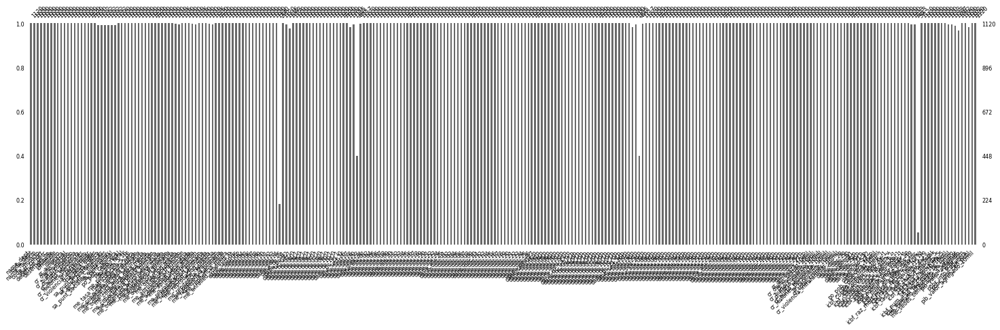

In [13]:
start_time = time.time()
msno.bar(mun, labels=True, figsize=(25,6), fontsize=8)
print("Ejecución: %s seconds" % (time.time() - start_time))

## Exploratory data analysis (EDA)

We define a function to perform the EDA for the data to get important information from them like central tendency measures, variability statistics, percentiles, missing data, among others.

In [14]:
# Define function to calculate exploratory statistics
def full_describe(dataframe,variables="all",variabilidad=20,completitud=10): #summary, univariado, describe, analisis descriptivo, describir, analisis exploratorio
    #Descripcion de los parametros:
    #dataframe: Tabla a usar en formato DataFrame
    #variables: variables sobre las que se va a calcular el describe. Formas posibles: "all", ingresar secuencia (ie. '1:8'), 
    #ingresar lista de numeros o de nombres de variables (ie. '1,4,9' o 'var1,var2,var3')
    #completitud: Minimo de completitud aceptada por variable (valor entre 0 y 100)
    #variabilidad: Minimo de variabilidad aceptada por variable (0,2,10,20,50,100)
    print("Inicia calculo del describe, Hora: "+ datetime.datetime.now().strftime("%H:%M:%S"))
    start1 = datetime.datetime.now()
    if variables == "all": #Si se desea analisis para todas las variables
        #Calcular describe y adicionar (concatenar) filas con Missing
        resumen=pd.concat([dataframe.describe(include="all",percentiles =[0,0.01,0.05,0.1,0.25,0.5,0.75,0.9,0.95,0.99,1]), dataframe.isnull().sum().to_frame(name = 'missing').T],sort=False)
    elif ":" in variables: #Si se desea analisis para secuencia de variables n1:n2
        #Calcular describe y adicionar (concatenar) filas con Missing
        variables_serie=list(pd.to_numeric((variables).split(':')))
        variables_serie=list(pd.Series(range(variables_serie[0],variables_serie[1])))
        resumen=pd.concat([dataframe.iloc[:,variables_serie].describe(include="all",percentiles =[0,0.01,0.05,0.1,0.25,0.5,0.75,0.9,0.95,0.99,1]), dataframe.iloc[:,variables_serie].isnull().sum().to_frame(name = 'missing').T],sort=False)
    else:
        try: #Si se desea analisis para array numerico (posiciones) de variables [n1,n2,n3,...]
            # Dividir valor de variables por coma, creando lista numerica
            variables_serie=list(pd.to_numeric((variables).split(',')))
            #Calcular describe y adicionar (concatenar) filas con Missing
            resumen=pd.concat([dataframe.iloc[:,variables_serie].describe(include="all",percentiles =[0,0.01,0.05,0.1,0.25,0.5,0.75,0.9,0.95,0.99,1]), dataframe.iloc[:,variables_serie].isnull().sum().to_frame(name = 'missing').T],sort=False)
        except: 
            if set(list(variables.split(","))).issubset(list(dataframe.columns)): #Si se desea analisis para array string (nombres de campos) de variables ['nom1','nom2','nom3',...]
                # Dividir valor de variables por coma, creando lista de cadena de texto
                variables_serie=list(variables.split(","))
                #Calcular describe y adicionar (concatenar) filas con Missing
                resumen=pd.concat([dataframe.loc[:,variables_serie].describe(include="all",percentiles =[0,0.01,0.05,0.1,0.25,0.5,0.75,0.9,0.95,0.99,1]), dataframe.loc[:,variables_serie].isnull().sum().to_frame(name = 'missing').T],sort=False)
            else: #Garbage Collector para casos diferentes
                resumen="Invalid entry for variables"
                
    print("Finaliza calculo del describe. Tiempo transcurrido: "+str((datetime.datetime.now() - start1).seconds)+" segs")
    
    start2 = datetime.datetime.now()
    print("Inicia calculo de completitud y variabilidad, Hora: "+ datetime.datetime.now().strftime("%H:%M:%S"))
    if isinstance(resumen, pd.DataFrame)==True: #Verificar si existe algun error en los parametros ingresados
        #Calcular cantidad total
        resumen.loc['total count']=resumen.loc[['count','missing']].sum()
        #Calcular porcentaje de missing
        resumen.loc['% missing']=np.around((resumen.loc['missing']*100/resumen.loc['total count']).astype(np.double),4)
        #Trasponer para usar de mejor forma el codigo
        resumen=resumen.T
        #Calcular variabilidad
        resumen['variabilidad'] = np.where(resumen['min']==resumen['max'], '00_variacion', 
                                           np.where(resumen['1%']==resumen['99%'], '02_variacion', 
                                                   np.where(resumen['5%']==resumen['95%'], '10_variacion', 
                                                           np.where(resumen['10%']==resumen['90%'], '20_variacion', 
                                                                   np.where(resumen['25%']==resumen['75%'], '50_variacion', 
                                                                           'variabilidad_alta')))))
        if variabilidad == 0:
            resumen['decision_variabilidad'] = "aceptar"
        elif variabilidad == 2:
            resumen['decision_variabilidad'] = np.where(resumen['variabilidad']=='00_variacion', 'rechazar',
                                                        'aceptar')
        elif variabilidad == 10:
            resumen['decision_variabilidad'] = np.where((resumen['variabilidad']=='00_variacion') | (resumen['variabilidad']=='02_variacion'), 'rechazar',
                                                        'aceptar')
        elif variabilidad == 20:
            resumen['decision_variabilidad'] = np.where((resumen['variabilidad']=='00_variacion') | (resumen['variabilidad']=='02_variacion') | (resumen['variabilidad']=='10_variacion'), 'rechazar',
                                                        'aceptar')
        elif variabilidad == 50:
            resumen['decision_variabilidad'] = np.where((resumen['variabilidad']=='00_variacion') | (resumen['variabilidad']=='02_variacion') | (resumen['variabilidad']=='10_variacion') | (resumen['variabilidad']=='20_variacion'), 'rechazar',
                                                        'aceptar')
        elif variabilidad == 100: 
            resumen['decision_variabilidad'] = np.where((resumen['variabilidad']=='00_variacion') | (resumen['variabilidad']=='02_variacion') | (resumen['variabilidad']=='10_variacion') | (resumen['variabilidad']=='20_variacion') | (resumen['variabilidad']=='50_variacion'), 'rechazar',
                                                        'aceptar')
        else:
            resumen['decision_variabilidad']="VALOR NO VALIDO"
            print("Invalid entry for parameter variabilidad")
        #Calcular completitud
        resumen['decision_completitud']=np.where(resumen['% missing']==0,'aceptar_100',
                                                 np.where(resumen['% missing']>completitud, 'rechazar','aceptar')) 
    else:
        resumen="Invalid entry for variables"
        
    print("Finaliza calculo de completitud y variabilidad. Tiempo transcurrido: "+str((datetime.datetime.now() - start2).seconds)+" segs")
    
    
    print("Finaliza calculo del proceso completo. Tiempo transcurrido total: "+str((datetime.datetime.now() - start1).seconds)+" segs")
    return resumen

In [15]:
#Applying EDA function to data
resumen=full_describe(dataframe=mun,variabilidad=20,completitud=30)
# resumen.to_clipboard(index=True,header=True)
resumen

Inicia calculo del describe, Hora: 12:49:00
Finaliza calculo del describe. Tiempo transcurrido: 0 segs
Inicia calculo de completitud y variabilidad, Hora: 12:49:01
Finaliza calculo de completitud y variabilidad. Tiempo transcurrido: 0 segs
Finaliza calculo del proceso completo. Tiempo transcurrido total: 1 segs


,count,unique,top,freq,mean,std,min,0%,1%,5%,...,95%,99%,100%,max,missing,total count,% missing,variabilidad,decision_variabilidad,decision_completitud
name_dept,1120,33,Antioquia,125,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0,1120,0,variabilidad_alta,aceptar,aceptar_100
code_dept,1120,33,05,125,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0,1120,0,variabilidad_alta,aceptar,aceptar_100
name_municip,1120,1032,La Union,4,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0,1120,0,variabilidad_alta,aceptar,aceptar_100
code_municip,1120,1120,13894,1,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0,1120,0,variabilidad_alta,aceptar,aceptar_100
year_cohort,1120,NaN,NaN,NaN,2019,0,2019,2019,2019,2019,...,2019,2019,2019,2019,0,1120,0,00_variacion,rechazar,aceptar_100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
pib_valor_agregado,1120,NaN,NaN,NaN,796.954,7209.02,1,1,9.38,24,...,2238.65,8337.52,226206,226206,0,1120,0,variabilidad_alta,aceptar,aceptar_100
pobr_ipm,1120,NaN,NaN,NaN,41.6936,17.2023,4.5,4.5,9.638,14.895,...,71.9,89.834,98.5,98.5,0,1120,0,variabilidad_alta,aceptar,aceptar_100
pobr_imp_cabecera,1102,NaN,NaN,NaN,28.1763,14.2291,3.4,3.4,7.9,10.7,...,56.99,69.094,82.1,82.1,18,1120,1.6071,variabilidad_alta,aceptar,aceptar
pobr_ipm_cen_pobl,1120,NaN,NaN,NaN,50.9762,17.4499,8.1,8.1,12.019,21.695,...,79.9,92.21,99.2,99.2,0,1120,0,variabilidad_alta,aceptar,aceptar_100


### Clustering dropout using DBScan algorithm

Although the DBScan method didn't work properly for our data, we leave the code to execute whether the users want to explore a bit in this way.

In [16]:
start_time = time.time()
# Set the variables to be taking into account
vars_keep=['desertion_perc', 'desertion_no','me_cobertura_neta']
X=mun[vars_keep].copy()

# Transform one variables because of its large sacle
X['desertion_no_log']=np.log(X['desertion_no'])
X['desertion_no_log']=X['desertion_no_log'].replace([np.inf, -np.inf], np.nan)
X['desertion_no_log']=X['desertion_no_log'].fillna(X['desertion_no_log'].min())

vars_keep_trans=['desertion_perc', 'desertion_no_log','me_cobertura_neta']
X_train=X[vars_keep_trans]

# Standardize variables
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Define DBScan parameters
dbscan = DBSCAN(eps=0.2, min_samples = 2)
# Fit DBScan
clusters = pd.Series(dbscan.fit_predict(X_scaled))
print(clusters.value_counts())

# Wrangling X matrix to be analized
X_scaled = pd.DataFrame(X_scaled)
X_scaled.columns = [sub + "_std" for sub in vars_keep_trans]
X=pd.concat([X,X_scaled],axis=1)
X = pd.concat([X, clusters], axis=1)
X = pd.concat([X, mun['name_municip']], axis=1)
X.rename(columns={0: "deser_perc_rank"},inplace=True)

# Plot information agains clusters
fig = px.scatter(X, x="desertion_no_log", y="desertion_perc", color="deser_perc_rank",width=700,height =500,hover_name='name_municip')
fig.show()

fig = px.scatter(X, x="me_cobertura_neta", y="desertion_perc", color="deser_perc_rank",width=700,height =500,hover_name='name_municip')
fig.show()
print("Ejecución: %s seconds" % (time.time() - start_time))

-1     390
 1     314
 10     10
 33     10
 37      9
      ... 
 91      2
 92      2
 93      2
 95      2
 68      2
Length: 137, dtype: int64


Ejecución: 25.656651973724365 seconds


### Clustering dropout using Kmeans algorithm

Kmeans is the chosen algorithm because of its vast use in clustering data.

The first step is to find the optimal number of clusters to be used.

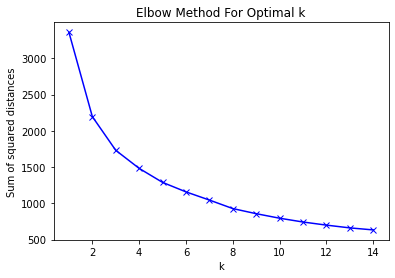

Ejecución: 4.811155080795288 seconds


In [17]:
start_time = time.time()
#Set variables to be included
vars_keep=['desertion_perc', 'desertion_no','me_cobertura_neta']
X=mun[vars_keep].copy()

#Transform variable because of its large scale
X['desertion_no_log']=np.log(X['desertion_no'])
X['desertion_no_log']=X['desertion_no_log'].replace([np.inf, -np.inf], np.nan)
X['desertion_no_log']=X['desertion_no_log'].fillna(X['desertion_no_log'].min())
vars_keep_trans=['desertion_perc', 'desertion_no_log','me_cobertura_neta']

#Standardize data
X_train=X[vars_keep_trans]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)
#X_scaled = X_train

#Iterate to find the optimal number of clusters by measuring the inertia
Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k, random_state=12345)
    km = km.fit(X_scaled)
    Sum_of_squared_distances.append(km.inertia_)

#Plot screeplot
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum of squared distances')
plt.title('Elbow Method For Optimal k')
plt.show()
print("Ejecución: %s seconds" % (time.time() - start_time))

### Fit Kmeans with 4 groups and 3 variables

After a bunch of trials (using different clusters and two or three variables), we decided to use 4 groups as the optimal number of clusters. 

Ejecución: 1.1157000064849854 seconds
2_DS_Baja-CB_Alta    355
1_DS_Baja-CB_Baja    269
4_DS_Alta-CB_Alta    254
3_DS_Alta-CB_Baja    242
Name: deser_perc_rank, dtype: int64
Inercia: 1481.630840321012


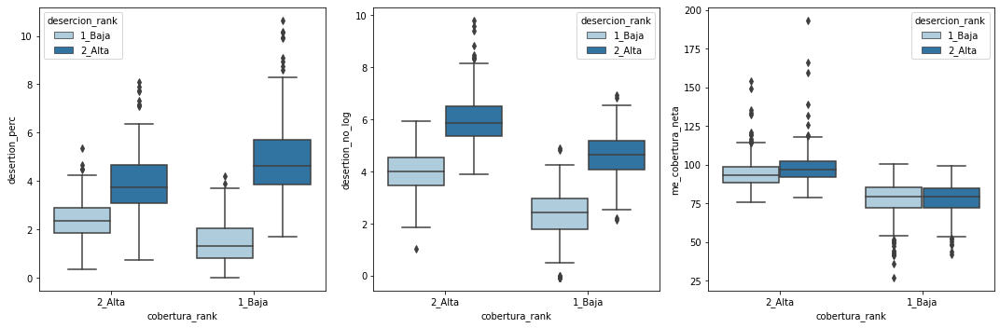

In [18]:
#Set variables to be used
vars_keep=['desertion_perc', 'desertion_no','me_cobertura_neta']
X=mun[vars_keep].copy()
#Transform one variable due to its large scale
X['desertion_no_log']=np.log(X['desertion_no'])
X['desertion_no_log']=X['desertion_no_log'].replace([np.inf, -np.inf], np.nan)
X['desertion_no_log']=X['desertion_no_log'].fillna(X['desertion_no_log'].min())
vars_keep_trans=['desertion_perc', 'desertion_no_log','me_cobertura_neta']
#Standardize data
X_train=X[vars_keep_trans]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)
#X_scaled=X_train

start_time = time.time()
#Fit Kmeans with 4 groups
km = KMeans(n_clusters=4, random_state=12345).fit(X_scaled)
clusters=pd.Series(km.labels_)

#Wrangling to adjust the X matrix
X_scaled = pd.DataFrame(X_scaled)
X_scaled.columns = [sub + "_std" for sub in vars_keep_trans]
X=pd.concat([X,X_scaled],axis=1)
X = pd.concat([X, clusters], axis=1)
X = pd.concat([X, mun['name_municip']], axis=1)
X.rename(columns={0: "deser_perc_rank_aux"},inplace=True)

#Creating variables for desertion and coverage (low, High)
ranks=X.groupby(['deser_perc_rank_aux'])['desertion_perc','me_cobertura_neta'].mean().reset_index()
ranks=ranks.sort_values(by=['desertion_perc']).reset_index()
ranks['des_flag']=[0,0,1,1]
ranks=ranks.sort_values(by=['me_cobertura_neta']).reset_index()
ranks['cob_flag']=[0,0,1,1]

#Assing the name for the cluster
def flag_df(df):

    if (df['des_flag'] == 0) and (df['cob_flag'] == 0):
        return '1_DS_Baja-CB_Baja'
    elif (df['des_flag'] == 0) and (df['cob_flag'] == 1):
        return '2_DS_Baja-CB_Alta'
    elif (df['des_flag'] == 1) and (df['cob_flag'] == 0):
        return '3_DS_Alta-CB_Baja'
    elif (df['des_flag'] == 1) and (df['cob_flag'] == 1):
        return '4_DS_Alta-CB_Alta'

ranks['deser_perc_rank'] = ranks.apply(flag_df, axis = 1)

X=pd.merge(left=X, right=ranks, left_on='deser_perc_rank_aux', right_on='deser_perc_rank_aux',how='left')
X=X.drop(['desertion_perc_y', 'me_cobertura_neta_y', 'des_flag', 'cob_flag','deser_perc_rank_aux','level_0','index'], axis=1)
X.rename(columns = {'desertion_perc_x':'desertion_perc','me_cobertura_neta_x':'me_cobertura_neta'}, inplace = True) 

#Creating flags for desertion and coverage (low, High)
X['cobertura_rank']=np.where(X['deser_perc_rank'].str.slice(10,17).isin(['CB_Baja']),'1_Baja','2_Alta')
X['desercion_rank']=np.where(X['deser_perc_rank'].str.slice(2,9).isin(['DS_Baja']),'1_Baja','2_Alta')

#Plot the clusters obtained
bp_vars=vars_keep_trans+['deser_perc_rank']
fig, axes = plt.subplots(1,3,figsize=(15,5)) # create figure and axes

ax = sns.boxplot(x="cobertura_rank", y="desertion_perc", hue="desercion_rank",data=X, palette="Paired",ax=axes.flatten()[0])
ax = sns.boxplot(x="cobertura_rank", y="desertion_no_log", hue="desercion_rank",data=X, palette="Paired",ax=axes.flatten()[1])
ax = sns.boxplot(x="cobertura_rank", y="me_cobertura_neta", hue="desercion_rank",data=X, palette="Paired",ax=axes.flatten()[2])

# fig.delaxes(axes[1,1]) # remove empty subplot


plt.tight_layout() 


print("Ejecución: %s seconds" % (time.time() - start_time))

print(X['deser_perc_rank'].value_counts())
print("Inercia: "+str(km.inertia_))

fig = px.scatter_3d(X, x="desertion_no_log", y="me_cobertura_neta", z="desertion_perc", color="deser_perc_rank",hover_name="name_municip")
fig.show()

fig = px.scatter(X, x="desertion_no_log", y="desertion_perc", color="deser_perc_rank",width=700,height =500,hover_name='name_municip')
fig.show()

fig = px.scatter(X, x="me_cobertura_neta", y="desertion_perc", color="deser_perc_rank",width=700,height =500,hover_name='name_municip')
fig.show()


## Kruskal-Wallis test to evaluate clusters

Instead of an ANOVA, we use its non-parametrical alternative, the Kruskal-Wallis test to figure out if the clusters are relevant to separate the three variables.

In [19]:
#Add the clusters and flags to the original data frame
mun['deser_perc_rank']=X['deser_perc_rank']
mun['cobertura_rank']=X['cobertura_rank']
mun['desercion_rank']=X['desercion_rank']

#Perform Kruskal-Wallis for desertion rate
a=mun.loc[mun['deser_perc_rank']=="1_DS_Baja-CB_Baja"]['desertion_perc']
b=mun.loc[mun['deser_perc_rank']=="2_DS_Baja-CB_Alta"]['desertion_perc']
c=mun.loc[mun['deser_perc_rank']=="3_DS_Alta-CB_Baja"]['desertion_perc']
d=mun.loc[mun['deser_perc_rank']=="4_DS_Alta-CB_Alta"]['desertion_perc']
fvalue, pvalue =stats.kruskal(a,b,c,d)
print("desertion_perc test: F-value",fvalue,"P-value", pvalue)

#Perform Kruskal-Wallis for desertion (number of students)
a=mun.loc[mun['deser_perc_rank']=="1_DS_Baja-CB_Baja"]['desertion_no']
b=mun.loc[mun['deser_perc_rank']=="2_DS_Baja-CB_Alta"]['desertion_no']
c=mun.loc[mun['deser_perc_rank']=="3_DS_Alta-CB_Baja"]['desertion_no']
d=mun.loc[mun['deser_perc_rank']=="4_DS_Alta-CB_Alta"]['desertion_no']
fvalue, pvalue =stats.kruskal(a,b,c,d)
print("desertion_no test: F-value",fvalue,"P-value", pvalue)

#Perform Kruskal-Wallis for coverage
a=mun.loc[mun['deser_perc_rank']=="1_DS_Baja-CB_Baja"]['me_cobertura_neta']
b=mun.loc[mun['deser_perc_rank']=="2_DS_Baja-CB_Alta"]['me_cobertura_neta']
c=mun.loc[mun['deser_perc_rank']=="3_DS_Alta-CB_Baja"]['me_cobertura_neta']
d=mun.loc[mun['deser_perc_rank']=="4_DS_Alta-CB_Alta"]['me_cobertura_neta']
fvalue, pvalue =stats.kruskal(a,b,c,d)
print("me_cobertura_neta test: F-value",fvalue,"P-value", pvalue)


desertion_perc test: F-value 724.3930609983552 P-value 1.0778812918648596e-156
desertion_no test: F-value 791.796682781117 P-value 2.6021318411635706e-171
me_cobertura_neta test: F-value 604.68014296808 P-value 9.745287588555998e-131


# FEATURE SELECTION

To find the variables that are more correlated to the clusters found above, we use three approaches: Decision Trees, XGBoost and Random Forest.

### Fit Decision Tree
First we fit a Decision Tree model (CHAID) to get the importance of the attributes.

Ejecución: 1.1898977756500244 seconds


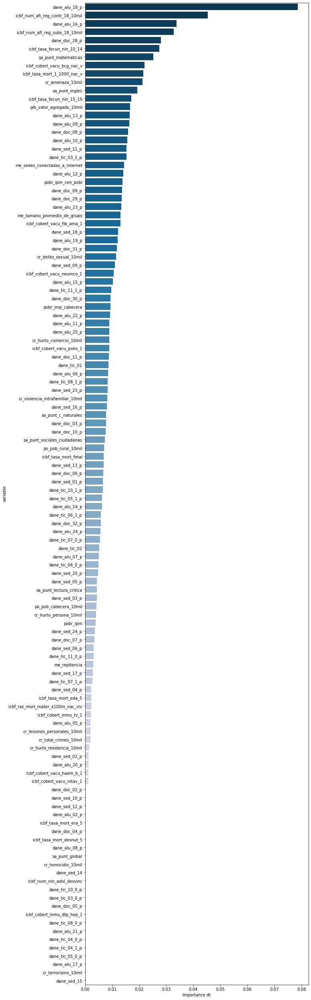

<Figure size 360x504 with 0 Axes>

In [20]:
#ARBOL DE DECISION
start_time = time.time()
#Imputing missing values
mun_nomiss=mun.copy()
mun_nomiss=mun_nomiss.fillna(mun_nomiss.median())

#Remove variables that we don't want to participate in the selection
vars_drop = list(['name_dept', 'code_dept', 'name_municip', 'code_municip', 'year_cohort'
                  ,'desertion_perc', 'desertion_no', 'latitude', 'longitude', 'region','deser_perc_rank', 'cobertura_rank', 'desercion_rank'
                  ,'me_cobertura_neta'
                  ,'me_desercion_transicion','me_desercion_primaria','me_desercion_secundaria','me_desercion_media'
                  ,'pib_valor_agregado','po_pob_cabecera','po_pob_rural','icbf_num_afi_reg_contr_18','icbf_num_afi_reg_subs_18','dane_alu_01','dane_alu_02','dane_alu_04','dane_alu_05','dane_alu_06','dane_alu_07','dane_alu_08','dane_alu_09','dane_alu_10','dane_alu_11','dane_alu_12','dane_alu_13','dane_alu_14','dane_alu_15','dane_alu_16','dane_alu_17','dane_alu_18','dane_alu_19','dane_alu_20','dane_alu_21','dane_alu_22','dane_alu_23','dane_alu_24','dane_alu_25','dane_doc_01','dane_doc_02','dane_doc_03','dane_doc_04','dane_doc_05','dane_doc_06','dane_doc_07','dane_doc_08','dane_doc_09','dane_doc_10','dane_doc_11','dane_doc_12','dane_doc_13','dane_doc_14','dane_doc_15','dane_doc_16','dane_doc_17','dane_doc_18','dane_doc_19','dane_doc_20','dane_doc_21','dane_doc_22','dane_doc_23','dane_doc_24','dane_doc_25','dane_doc_26','dane_doc_27','dane_doc_28','dane_doc_29','dane_doc_30','dane_doc_31','dane_doc_32','dane_sed_01','dane_sed_02','dane_sed_03','dane_sed_04','dane_sed_05','dane_sed_06','dane_sed_07','dane_sed_08','dane_sed_09','dane_sed_10','dane_sed_11','dane_sed_12','dane_sed_13','dane_tic_03_0','dane_tic_03_1','dane_tic_04_0','dane_tic_04_1','dane_tic_05_0','dane_tic_05_1','dane_tic_06_0','dane_tic_06_1','dane_tic_07_0','dane_tic_07_1','dane_tic_08_0','dane_tic_08_1','dane_tic_10_0','dane_tic_10_1','dane_tic_11_0','dane_tic_11_1','dane_sed_16','dane_sed_17','dane_sed_18','dane_sed_20','dane_sed_23','dane_sed_24','cr_amenaza','cr_delito_sexual','cr_homicidio','cr_hurto_comercio','cr_hurto_persona','cr_hurto_residencia','cr_lesiones_personales','cr_terrorismo','cr_total_crimes','cr_violencia_intrafamiliar','me_aprobacion','me_aprobacion_media','me_aprobacion_primaria','me_aprobacion_secundaria','me_aprobacion_transicion','me_cobertura_bruta','me_cobertura_bruta_media','me_cobertura_bruta_primaria','me_cobertura_bruta_secundaria','me_cobertura_bruta_transicion','me_cobertura_neta','me_cobertura_neta_media','me_cobertura_neta_primaria','me_cobertura_neta_secundaria','me_cobertura_neta_transicion','me_desercion_media','me_desercion_primaria','me_desercion_secundaria','me_desercion_transicion','me_enrolled_students_n','me_poblacion_5_16','me_repitencia_media','me_repitencia_primaria','me_repitencia_secundaria','me_repitencia_transicion','me_reprobacion','me_reprobacion_media','me_reprobacion_primaria','me_reprobacion_secundaria','me_reprobacion_transicion','me_tasa_matriculacion_5_16','po_pob_total','region'
                  ,'dane_doc_12_p','dane_doc_13_p','dane_doc_14_p','dane_doc_15_p','dane_doc_16_p','dane_doc_17_p','dane_doc_18_p','dane_doc_19_p','dane_doc_20_p','dane_doc_21_p','dane_doc_22_p','dane_doc_23_p','dane_doc_24_p','dane_doc_25_p','dane_doc_26_p','dane_doc_27_p'
])

#Set X (data) and y (label)
X_all=mun_nomiss.drop(vars_drop, axis=1)

y=mun_nomiss['deser_perc_rank']

#Fit DT
clf = DecisionTreeClassifier(random_state=12345)
clf = clf.fit(X_all, y)

#Extract feature importance
features_imp_dt=dict(zip(X_all.columns, clf.feature_importances_))
features_imp_dt=pd.DataFrame.from_dict(features_imp_dt, orient='index').reset_index()
features_imp_dt.rename(columns={'index':'variable',0:'Importance dt'},inplace=True)
features_imp_dt=features_imp_dt.sort_values(by='Importance dt', ascending=False)
# features_imp_dt.to_clipboard(index=False,header=True)

#Plot feature importance
plt.figure(figsize=(10,45))
ax = sns.barplot(x="Importance dt", y="variable", data=features_imp_dt,palette="PuBu_r")
plt.figure(figsize=(5,7))
# ax = sns.barplot(x="Importance dt", y="variable", data=features_imp_dt[0:20],palette="PuBu_r")

print("Ejecución: %s seconds" % (time.time() - start_time))

To know how a model would perform, we fit a model with the top 10 most important variables.

In [24]:
start_time = time.time()
feature_cols = ['dane_alu_18_p','icbf_num_afi_reg_contr_18_10mil','icbf_num_afi_reg_subs_18_10mil','sa_punt_c_naturales','dane_alu_16_p','icbf_tasa_fecun_nin_10_14','dane_sed_16_p','dane_alu_06_p','icbf_tasa_mort_fetal','dane_alu_13_p']

#Set the X matrix
X = X_all[feature_cols]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=12345)

#Fit the model
clf = DecisionTreeClassifier(max_depth=3,random_state=1234)
clf = clf.fit(X_train,y_train)

#Predict categories
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)

#Print goodness of fit and validation measures
def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return metrics.roc_auc_score(y_test, y_pred, average=average)
print("AUROC train:",multiclass_roc_auc_score(y_train,y_pred_train))
print("AUROC test:",multiclass_roc_auc_score(y_test,y_pred_test))
print("Accuracy train:",metrics.accuracy_score(y_train, y_pred_train))
print("Accuracy test:",metrics.accuracy_score(y_test, y_pred_test))
print("Recall (Sensitivity) train:",metrics.recall_score(y_train, y_pred_train, average=None))
print("Recall (Sensitivity) test:",metrics.recall_score(y_test, y_pred_test, average=None))
print("F1 Score train:",metrics.f1_score(y_train, y_pred_train, average=None))
print("F1 Score test:",metrics.f1_score(y_test, y_pred_test, average=None))
# pd.DataFrame(metrics.confusion_matrix(y_pred_test,y_test)).to_clipboard(index=True,header=True)
print("Confusion Matrix: ")
print(pd.DataFrame(metrics.confusion_matrix(y_pred_test,y_test)))
print("Ejecución: %s seconds" % (time.time() - start_time))

AUROC train: 0.6942362812144556
AUROC test: 0.665999913264165
Accuracy train: 0.53125
Accuracy test: 0.5089285714285714
Recall (Sensitivity) train: [0.56944444 0.43986254 0.38613861 0.78609626]
Recall (Sensitivity) test: [0.58490566 0.4375     0.35       0.6119403 ]
F1 Score train: [0.5371179  0.48854962 0.42506812 0.66365688]
F1 Score test: [0.60784314 0.44444444 0.32183908 0.61654135]
Confusion Matrix: 
    0   1   2   3
0  31  12   6   0
1   8  28   9  17
2  10  14  14   9
3   4  10  11  41
Ejecución: 0.0811777114868164 seconds


## Fit XG-Boost
### Feature selection
Second, we fit a XGBoost model to get the importance of the attributes.

Ejecución: 4.079284191131592 seconds


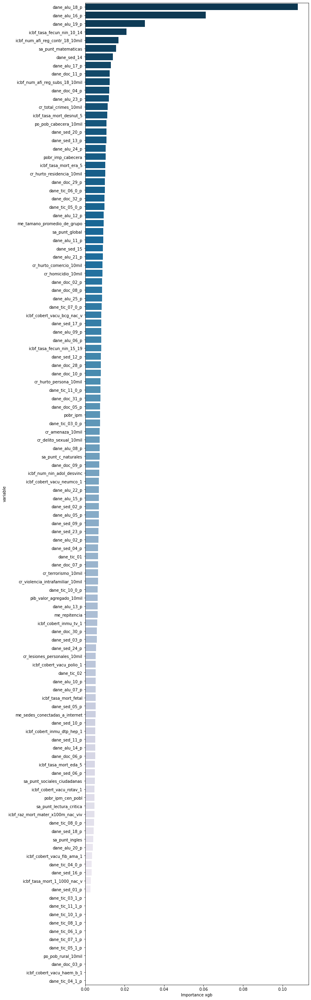

In [26]:
start_time = time.time()
X_all=mun_nomiss.drop(vars_drop, axis=1)

y=mun_nomiss['deser_perc_rank']

# define the model
xgb_model = XGBClassifier(random_state=12345)
# fit the model
xgb_model =xgb_model.fit(X_all, y)
# get importance
 
features_imp_xgb=dict(zip(X_all.columns, xgb_model.feature_importances_))
features_imp_xgb=pd.DataFrame.from_dict(features_imp_xgb, orient='index').reset_index()
features_imp_xgb.rename(columns={'index':'variable',0:'Importance xgb'},inplace=True)
features_imp_xgb=features_imp_xgb.sort_values(by='Importance xgb', ascending=False)
# features_imp_xgb.to_clipboard(index=False,header=True)

plt.figure(figsize=(10,45))
ax = sns.barplot(x="Importance xgb", y="variable", data=features_imp_xgb,palette="PuBu_r")

# plt.figure(figsize=(5,7))
# ax = sns.barplot(x="Importance xgb", y="variable", data=features_imp_xgb[0:20],palette="PuBu_r")

print("Ejecución: %s seconds" % (time.time() - start_time))

To know how a model would perform, we fit a model with the top 10 most important variables. In the first place, we do a cross-validated grid search to find the optimal hyperparameters.

In [27]:
start_time = time.time()
feature_cols = ['dane_alu_18_p','dane_alu_16_p','dane_alu_19_p','icbf_tasa_fecun_nin_10_14','icbf_num_afi_reg_contr_18_10mil','sa_punt_matematicas','dane_sed_14','dane_sed_20_p','dane_alu_23_p','po_pob_cabecera_10mil']

#Define X matrix
X = X_all[feature_cols]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=12345)

#Define the grid to be searched in
xgb1 = XGBClassifier(random_state=12345)
parameters = {'max_depth':range(3,10,2),
    'min_child_weight':range(1,6,2),
    'learning_rate': [0.0001, 0.001, 0.01, 0.1, 0.2]}

#Execute cross-validated grid search
xgb_grid = GridSearchCV(xgb1,parameters,cv = 5,n_jobs = -1,verbose=False)

#Print the optimal hyperparameters
xgb_grid.fit(X_train,y_train)

print(xgb_grid.best_score_)
print(xgb_grid.best_params_)
print("Ejecución: %s seconds" % (time.time() - start_time))

0.5010800744878957
{'learning_rate': 0.1, 'max_depth': 3, 'min_child_weight': 5}
Ejecución: 95.21733236312866 seconds


Finally, we fit the model with the optimal hyperparameters.

In [33]:
start_time = time.time()
#Set the X matrix
X = X_all[feature_cols]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=12345)

#Fit the model
xgb = XGBClassifier(random_state=12345,learning_rate=0.1,max_depth=3,min_child_weight=5)
xgb = xgb.fit(X_train,y_train)
#Predict categories
y_pred_train = xgb.predict(X_train)
y_pred_test = xgb.predict(X_test)

#Print goodness of fit and validation measures
def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return metrics.roc_auc_score(y_test, y_pred, average=average)
print("AUROC train:",multiclass_roc_auc_score(y_train,y_pred_train))
print("AUROC test:",multiclass_roc_auc_score(y_test,y_pred_test))
print("Accuracy train:",metrics.accuracy_score(y_train, y_pred_train))
print("Accuracy test:",metrics.accuracy_score(y_test, y_pred_test))
print("Recall (Sensitivity) train:",metrics.recall_score(y_train, y_pred_train, average=None))
print("Recall (Sensitivity) test:",metrics.recall_score(y_test, y_pred_test, average=None))
print("F1 Score train:",metrics.f1_score(y_train, y_pred_train, average=None))
print("F1 Score test:",metrics.f1_score(y_test, y_pred_test, average=None))
# pd.DataFrame(metrics.confusion_matrix(y_pred_test,y_test)).to_clipboard(index=True,header=True)
print("Confusion Matrix: ")
print(pd.DataFrame(metrics.confusion_matrix(y_pred_test,y_test)))
print("Ejecución: %s seconds" % (time.time() - start_time))

AUROC train: 0.8461280454629235
AUROC test: 0.6834871755458619
Accuracy train: 0.7723214285714286
Accuracy test: 0.5535714285714286
Recall (Sensitivity) train: [0.81944444 0.79381443 0.60891089 0.86096257]
Recall (Sensitivity) test: [0.66037736 0.625      0.125      0.65671642]
F1 Score train: [0.79550562 0.752443   0.69101124 0.85411141]
F1 Score test: [0.63636364 0.55555556 0.14705882 0.6984127 ]
Confusion Matrix: 
    0   1   2   3
0  35  12  10   0
1  12  40  16  12
2   6   6   5  11
3   0   6   9  44
Ejecución: 0.5021131038665771 seconds


## Ajuste de Random Forest
### Feature selection
Third, we fit a Random Forest model to get the importance of the attributes.

Ejecución: 1.2843573093414307 seconds


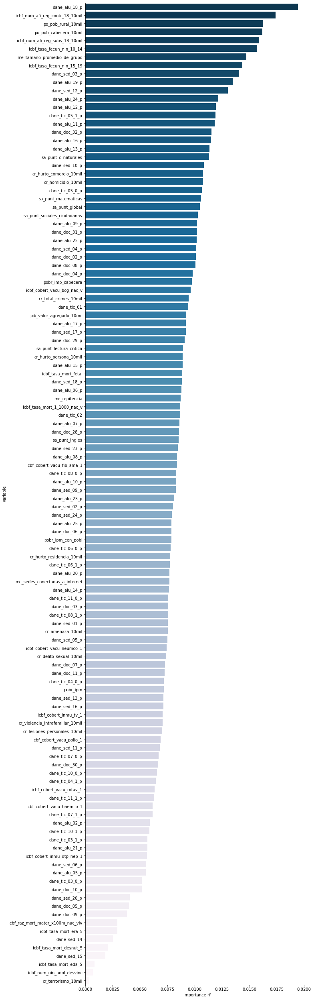

In [34]:
start_time = time.time()

#Set the X matrix and y label
X_all=mun_nomiss.drop(vars_drop, axis=1)

y=mun_nomiss['deser_perc_rank']

# Fit the model
rf_model = RandomForestClassifier(random_state=12345)

rf_model = rf_model.fit(X_all, y)

# Get importance
features_imp_rf=dict(zip(X_all.columns, rf_model.feature_importances_))
features_imp_rf=pd.DataFrame.from_dict(features_imp_rf, orient='index').reset_index()
features_imp_rf.rename(columns={'index':'variable',0:'Importance rf'},inplace=True)
features_imp_rf=features_imp_rf.sort_values(by='Importance rf', ascending=False)
# features_imp_rf.to_clipboard(index=False,header=True)

plt.figure(figsize=(10,45))
ax = sns.barplot(x="Importance rf", y="variable", data=features_imp_rf,palette="PuBu_r")

# plt.figure(figsize=(5,7))
# ax = sns.barplot(x="Importance rf", y="variable", data=features_imp_rf[0:20],palette="PuBu_r")

print("Ejecución: %s seconds" % (time.time() - start_time))

To know how a model would perform, we fit a model with the top 10 most important variables. In the first place, we do a cross-validated grid search to find the optimal hyperparameters.

In [35]:
start_time = time.time()
feature_cols = ['po_pob_rural_10mil','me_tamano_promedio_de_grupo','po_pob_cabecera_10mil','dane_alu_18_p','dane_alu_19_p','icbf_num_afi_reg_contr_18_10mil','icbf_tasa_fecun_nin_10_14','icbf_num_afi_reg_subs_18_10mil','dane_sed_03_p','dane_doc_11_p']

#Define X matrix
X = X_all[feature_cols]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=12345)

#Define the grid to be searched in
rf1 = RandomForestClassifier(random_state=12345)
parameters = {'n_estimators':range(1,100,20),
    'max_depth':range(3,10,2),
    'min_samples_split':range(5,20,5),
    'min_samples_leaf':range(5,20,5)}

#Execute cross-validated grid search
rf_grid = GridSearchCV(rf1,parameters,cv = 5,n_jobs = -1,verbose=False)
rf_grid.fit(X_train,y_train)

#Print the optimal hyperparameters
print(rf_grid.best_score_)
print(rf_grid.best_params_)
print("Ejecución: %s seconds" % (time.time() - start_time))

0.537877094972067
{'max_depth': 7, 'min_samples_leaf': 5, 'min_samples_split': 15, 'n_estimators': 41}
Ejecución: 65.29616117477417 seconds


Finally, we fit the model with the optimal hyperparameters.

In [36]:
start_time = time.time()
X = X_all[feature_cols]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=12345)
rf = RandomForestClassifier(random_state=12345,max_depth= 7, min_samples_leaf= 5, min_samples_split= 15, n_estimators= 41)
rf = rf.fit(X_train,y_train)
y_pred_train = rf.predict(X_train)
y_pred_test = rf.predict(X_test)
def multiclass_roc_auc_score(y_test, y_pred, average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    return metrics.roc_auc_score(y_test, y_pred, average=average)
print("AUROC train:",multiclass_roc_auc_score(y_train,y_pred_train))
print("AUROC test:",multiclass_roc_auc_score(y_test,y_pred_test))
print("Accuracy train:",metrics.accuracy_score(y_train, y_pred_train))
print("Accuracy test:",metrics.accuracy_score(y_test, y_pred_test))
print("Recall (Sensitivity) train:",metrics.recall_score(y_train, y_pred_train, average=None))
print("Recall (Sensitivity) test:",metrics.recall_score(y_test, y_pred_test, average=None))
print("F1 Score train:",metrics.f1_score(y_train, y_pred_train, average=None))
print("F1 Score test:",metrics.f1_score(y_test, y_pred_test, average=None))
pd.DataFrame(metrics.confusion_matrix(y_pred_test,y_test)).to_clipboard(index=True,header=True)
print("Ejecución: %s seconds" % (time.time() - start_time))

AUROC train: 0.8216277386122857
AUROC test: 0.6532912324224419
Accuracy train: 0.7377232142857143
Accuracy test: 0.5133928571428571
Recall (Sensitivity) train: [0.69907407 0.79037801 0.63861386 0.80748663]
Recall (Sensitivity) test: [0.52830189 0.65625    0.075      0.62686567]
F1 Score train: [0.72596154 0.72669826 0.7107438  0.79473684]
F1 Score test: [0.55445545 0.51219512 0.09836066 0.68852459]
Ejecución: 0.2918095588684082 seconds


To sum up the results of the three previous algorithms, we use a position based index.

In [37]:
#Get position of variables from Decistion Tree
features_imp_dt=features_imp_dt.rename_axis('posicion dt').reset_index()
features_imp_dt['posicion dt']=features_imp_dt.index

#Get position of variables from XGboost
features_imp_xgb=features_imp_xgb.rename_axis('posicion xgb').reset_index()
features_imp_xgb['posicion xgb']=features_imp_xgb.index

#Get position of variables from Random forest
features_imp_rf=features_imp_rf.rename_axis('posicion rf').reset_index()
features_imp_rf['posicion rf']=features_imp_rf.index

#Sum up the results
features_all=pd.merge(features_imp_dt, features_imp_xgb, how='left', on="variable")
features_all=pd.merge(features_all, features_imp_rf, how='left', on="variable")
features_all['posicion_final']=features_all['posicion dt']+features_all['posicion xgb']+features_all['posicion rf']
features_all=features_all.sort_values(by=['posicion_final'])
# features_all[['variable','posicion_final']].to_clipboard(index=False,header=True)
features_all[['variable','posicion_final']]

,variable,posicion_final
0,dane_alu_18_p,0
1,icbf_num_afi_reg_contr_18_10mil,6
5,icbf_tasa_fecun_nin_10_14,13
3,icbf_num_afi_reg_subs_18_10mil,16
2,dane_alu_16_p,19
...,...,...
112,dane_tic_04_0_p,296
109,icbf_cobert_inmu_dtp_hep_1,298
116,cr_terrorismo_10mil,301
92,icbf_cobert_vacu_haem_b_1,304


To validate each of the variables (the most interesting ones), we create some visualizations, separated by clusters.

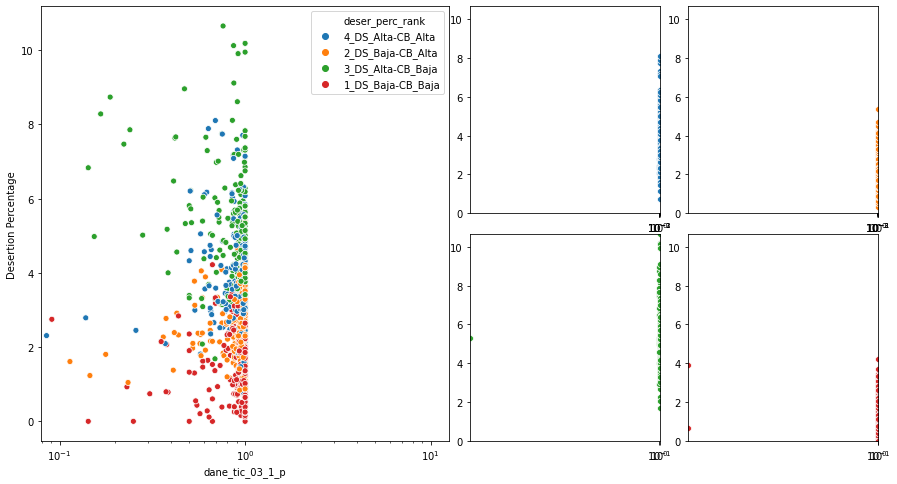

In [38]:
#Define variable to be ploted
var="dane_tic_03_1_p"
#Choose if log transformation should be applied
log_scale=True
# fig, axes = plt.subplots(1,1,figsize=(10,5)) # create figure and axes
# fig = px.scatter(mun, x=var, y="desertion_perc", width=900,height =350,hover_name='name_municip'
#                 ,log_x=log_scale
#                 ,color="deser_perc_rank")
# fig.show()

#Plot figures
fig = plt.figure(figsize=(15, 8))
outer = gridspec.GridSpec(1, 2, wspace=0.05, hspace=0.1)
inner = gridspec.GridSpecFromSubplotSpec(1, 1,
                    subplot_spec=outer[0], wspace=0.1, hspace=0.1)
ax = plt.Subplot(fig, inner[0])
#t = ax.scatter(mun[var],mun['desertion_perc'],color='darkgrey')
sns.scatterplot(x=var,y='desertion_perc',hue='deser_perc_rank',\
                hue_order=['4_DS_Alta-CB_Alta','2_DS_Baja-CB_Alta','3_DS_Alta-CB_Baja','1_DS_Baja-CB_Baja']\
                ,data=mun,ax=ax)
ax.set_xlabel(var)
ax.set_ylabel('Desertion Percentage')
if log_scale:
    ax.set_xscale('log')
fig.add_subplot(ax)
inner = gridspec.GridSpecFromSubplotSpec(2, 2,
                subplot_spec=outer[1], wspace=0.15, hspace=0.1)
titles=['4_DS_Alta-CB_Alta','2_DS_Baja-CB_Alta','3_DS_Alta-CB_Baja','1_DS_Baja-CB_Baja']
colors=['crimson','green','blue','purple']
for j in range(4):
    ax = plt.Subplot(fig, inner[j])
    #t = ax.scatter(mun.loc[mun.deser_perc_rank==titles[j],var],mun.loc[mun.deser_perc_rank==titles[j],'desertion_perc'],color=colors[j])
    sns.scatterplot(x=var,y='desertion_perc',data=mun[mun.deser_perc_rank==titles[j]],ax=ax,color=sns.color_palette()[j])
    #ax.set_title(titles[j])
    ax.set_xlim(mun[var].min(),mun[var].max())
    ax.set_ylim(mun['desertion_perc'].min(),mun['desertion_perc'].max())
    ax.set_xlabel('')
    ax.set_ylabel('')
    if log_scale:
         ax.set_xscale('log')
    fig.add_subplot(ax)
fig.show()

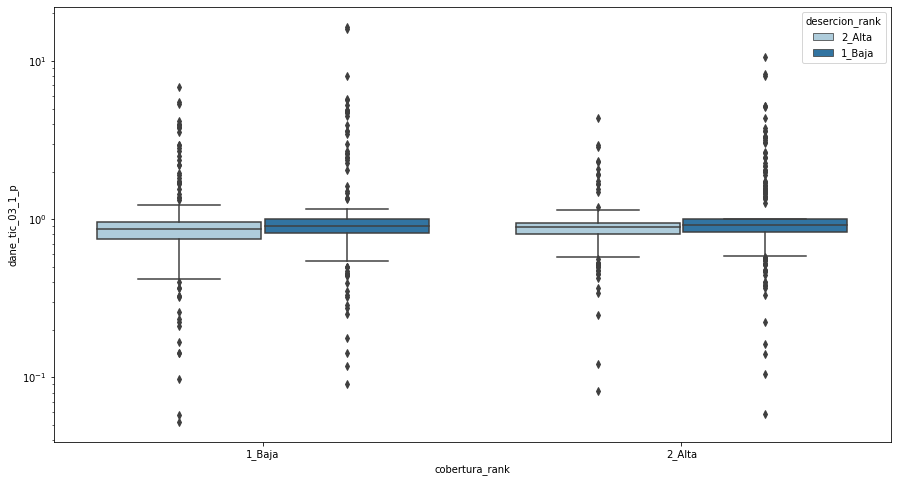

In [30]:
#Plot Boxplot
fig = plt.figure(figsize=(15, 8))
a = sns.boxplot(x="cobertura_rank", y=var, hue="desercion_rank",data=mun, palette="Paired")
if log_scale:
    a.set_yscale('log')

To get a glance of the correlation between the exogenous variables, we perform a correlation matrix.

In [39]:
corr_mat  = X_all.corr()
#sns.heatmap(corr_mat,cmap=sns.diverging_palette(220, 10, as_cmap=True))
#plt.title("Correlation Matrix")
corr_mat.style.background_gradient(cmap='coolwarm')


## Exporting data to RDS 

In this point, we have all the information that we need to put in our Dash. That's why we pass the data frame (with the clusters) to the RDS to be used in the Dashboard.

In [14]:
mun_nomiss.to_sql('cluster_master_table_by_municipio', engine)

# Feature selection inside each cluster

To characterize the clusters, again we use the feature selection attribute of the Random Forest method, but this time inside of each cluster and now using the label "dropout percentage" and the Regressor Random Forest.

First we separated our main dataframe en each cluster.

In [41]:
start_time = time.time()
#Separate in each cluster
DS_Baja_CB_Baja=mun_nomiss[mun_nomiss['deser_perc_rank']=='1_DS_Baja-CB_Baja']
DS_Baja_CB_Alta=mun_nomiss[mun_nomiss['deser_perc_rank']=='2_DS_Baja-CB_Alta']
DS_Alta_CB_Baja=mun_nomiss[mun_nomiss['deser_perc_rank']=='3_DS_Alta-CB_Baja']
DS_Alta_CB_Alta=mun_nomiss[mun_nomiss['deser_perc_rank']=='4_DS_Alta-CB_Alta']

#Drop variables not to be used
vars_drop = list(['name_dept', 'code_dept', 'name_municip', 'code_municip', 'year_cohort'
                  ,'desertion_perc', 'desertion_no', 'latitude', 'longitude', 'region','deser_perc_rank', 'cobertura_rank', 'desercion_rank'
                  ,'me_cobertura_neta'
                  ,'me_desercion_transicion','me_desercion_primaria','me_desercion_secundaria','me_desercion_media'
                  ,'dane_sed_20','dane_sed_20_p','dane_sed_14','icbf_num_nin_adol_desvinc'
                  ,'dane_doc_12_p','dane_doc_13_p','dane_doc_14_p','dane_doc_15_p','dane_doc_16_p','dane_doc_17_p','dane_doc_18_p','dane_doc_19_p','dane_doc_20_p','dane_doc_21_p','dane_doc_22_p','dane_doc_23_p','dane_doc_24_p','dane_doc_25_p','dane_doc_26_p','dane_doc_27_p','dane_doc_12','dane_doc_13','dane_doc_14','dane_doc_15','dane_doc_16','dane_doc_17','dane_doc_18','dane_doc_19','dane_doc_20','dane_doc_21','dane_doc_22','dane_doc_23','dane_doc_24','dane_doc_25','dane_doc_26','dane_doc_27'
                  ,'pib_valor_agregado','me_reprobacion','me_aprobacion','me_tasa_matriculacion_5_16','me_aprobacion_transicion','dane_alu_11','me_aprobacion_primaria','me_cobertura_bruta','po_pob_total','me_cobertura_neta_secundaria','me_cobertura_neta_primaria','me_aprobacion_secundaria','icbf_num_afi_reg_subs_18','me_aprobacion_media','me_cobertura_bruta_secundaria','dane_sed_10','po_pob_cabecera','me_cobertura_bruta_primaria','me_enrolled_students_n','dane_alu_11_p','dane_alu_09_p','me_poblacion_5_16','dane_sed_03','me_reprobacion_secundaria','dane_sed_08','me_cobertura_bruta_media','me_reprobacion_media','dane_sed_09','dane_alu_23','dane_alu_23_p','me_cobertura_neta_media','dane_alu_01','me_cobertura_neta_transicion','me_cobertura_bruta_transicion','dane_sed_02_p','dane_sed_11','dane_sed_02','me_reprobacion_primaria'
                  ,'po_pob_cabecera','po_pob_rural','icbf_num_afi_reg_contr_18','icbf_num_afi_reg_subs_18','dane_alu_01','dane_alu_02','dane_alu_04','dane_alu_05','dane_alu_06','dane_alu_07','dane_alu_08','dane_alu_09','dane_alu_10','dane_alu_11','dane_alu_12','dane_alu_13','dane_alu_14','dane_alu_15','dane_alu_16','dane_alu_17','dane_alu_18','dane_alu_19','dane_alu_20','dane_alu_21','dane_alu_22','dane_alu_23','dane_alu_24','dane_alu_25','dane_doc_01','dane_doc_02','dane_doc_03','dane_doc_04','dane_doc_05','dane_doc_06','dane_doc_07','dane_doc_08','dane_doc_09','dane_doc_10','dane_doc_11','dane_doc_12','dane_doc_13','dane_doc_14','dane_doc_15','dane_doc_16','dane_doc_17','dane_doc_18','dane_doc_19','dane_doc_20','dane_doc_21','dane_doc_22','dane_doc_23','dane_doc_24','dane_doc_25','dane_doc_26','dane_doc_27','dane_doc_28','dane_doc_29','dane_doc_30','dane_doc_31','dane_doc_32','dane_sed_01','dane_sed_02','dane_sed_03','dane_sed_04','dane_sed_05','dane_sed_06','dane_sed_07','dane_sed_08','dane_sed_09','dane_sed_10','dane_sed_11','dane_sed_12','dane_sed_13','dane_tic_03_0','dane_tic_03_1','dane_tic_04_0','dane_tic_04_1','dane_tic_05_0','dane_tic_05_1','dane_tic_06_0','dane_tic_06_1','dane_tic_07_0','dane_tic_07_1','dane_tic_08_0','dane_tic_08_1','dane_tic_10_0','dane_tic_10_1','dane_tic_11_0','dane_tic_11_1','dane_sed_16','dane_sed_17','dane_sed_18','dane_sed_20','dane_sed_23','dane_sed_24','cr_amenaza','cr_delito_sexual','cr_homicidio','cr_hurto_comercio','cr_hurto_persona','cr_hurto_residencia','cr_lesiones_personales','cr_terrorismo','cr_total_crimes','cr_violencia_intrafamiliar','me_aprobacion','me_aprobacion_media','me_aprobacion_primaria','me_aprobacion_secundaria','me_aprobacion_transicion','me_cobertura_bruta','me_cobertura_bruta_media','me_cobertura_bruta_primaria','me_cobertura_bruta_secundaria','me_cobertura_bruta_transicion','me_cobertura_neta','me_cobertura_neta_media','me_cobertura_neta_primaria','me_cobertura_neta_secundaria','me_cobertura_neta_transicion','me_desercion_media','me_desercion_primaria','me_desercion_secundaria','me_desercion_transicion','me_enrolled_students_n','me_poblacion_5_16','me_repitencia_media','me_repitencia_primaria','me_repitencia_secundaria','me_repitencia_transicion','me_reprobacion','me_reprobacion_media','me_reprobacion_primaria','me_reprobacion_secundaria','me_reprobacion_transicion','me_tasa_matriculacion_5_16','po_pob_total','region'

])

## DS_Baja_CB_Baja

Here we adjust the Random Forest for the municipalities clustered in the low dropout rate and low coverage.

Ejecución: 1.6876816749572754 seconds


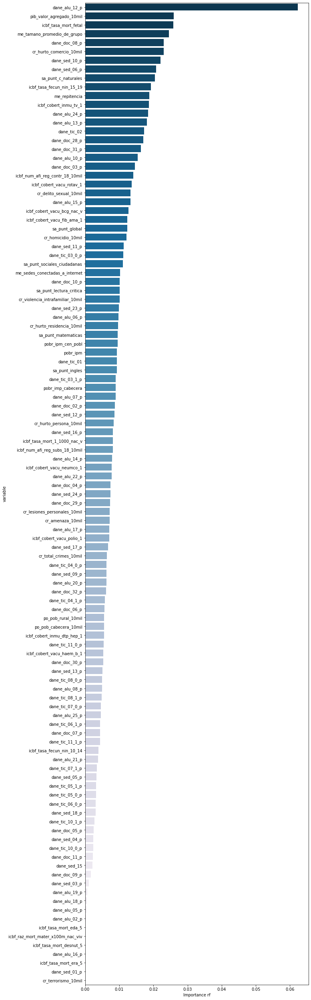

In [42]:
start_time = time.time()
X_all=DS_Baja_CB_Baja.drop(vars_drop, axis=1)

y=DS_Baja_CB_Baja['desertion_perc']

# define the model
rf_model = RandomForestRegressor(random_state=12345)
# fit the model
rf_model = rf_model.fit(X_all, y)
# get importance
 
features_imp_rf=dict(zip(X_all.columns, rf_model.feature_importances_))
features_imp_rf=pd.DataFrame.from_dict(features_imp_rf, orient='index').reset_index()
features_imp_rf.rename(columns={'index':'variable',0:'Importance rf'},inplace=True)
features_imp_rf=features_imp_rf.sort_values(by='Importance rf', ascending=False)
# features_imp_rf.to_clipboard(index=False,header=True)

plt.figure(figsize=(10,45))
ax = sns.barplot(x="Importance rf", y="variable", data=features_imp_rf,palette="PuBu_r")

# plt.figure(figsize=(5,7))
# ax = sns.barplot(x="Importance rf", y="variable", data=features_imp_rf[0:20],palette="PuBu_r")

print("Ejecución: %s seconds" % (time.time() - start_time))

## DS_Baja_CB_Alta
Here we adjust the Random Forest for the municipalities clustered in the low dropout rate and high coverage.

Ejecución: 2.0319230556488037 seconds


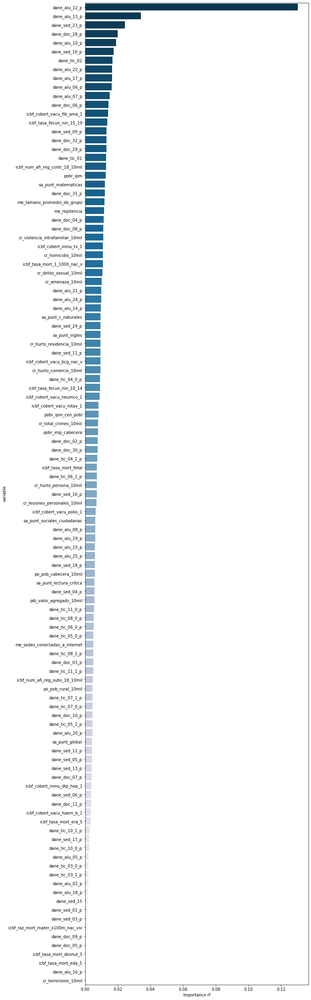

In [43]:
start_time = time.time()
X_all=DS_Baja_CB_Alta.drop(vars_drop, axis=1)

y=DS_Baja_CB_Alta['desertion_perc']

# define the model
rf_model = RandomForestRegressor(random_state=12345)
# fit the model
rf_model = rf_model.fit(X_all, y)
# get importance
 
features_imp_rf=dict(zip(X_all.columns, rf_model.feature_importances_))
features_imp_rf=pd.DataFrame.from_dict(features_imp_rf, orient='index').reset_index()
features_imp_rf.rename(columns={'index':'variable',0:'Importance rf'},inplace=True)
features_imp_rf=features_imp_rf.sort_values(by='Importance rf', ascending=False)
# features_imp_rf.to_clipboard(index=False,header=True)

plt.figure(figsize=(10,45))
ax = sns.barplot(x="Importance rf", y="variable", data=features_imp_rf,palette="PuBu_r")

# plt.figure(figsize=(5,7))
# ax = sns.barplot(x="Importance rf", y="variable", data=features_imp_rf[0:20],palette="PuBu_r")

print("Ejecución: %s seconds" % (time.time() - start_time))

## DS_Alta_CB_Baja
Here we adjust the Random Forest for the municipalities clustered in the high  dropout rate and low coverage.

Ejecución: 1.7067062854766846 seconds


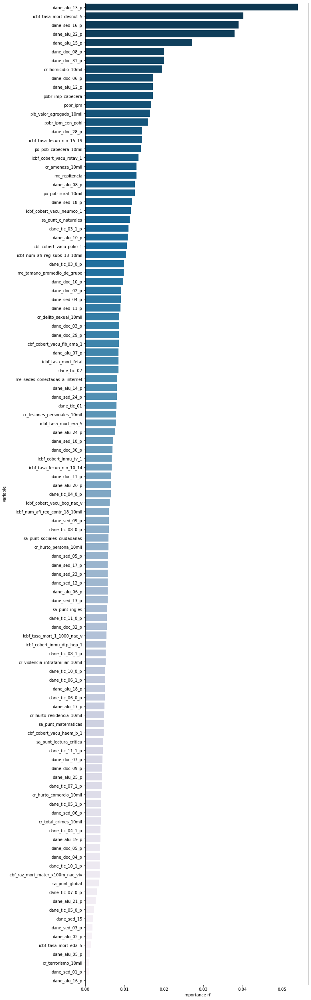

In [44]:
start_time = time.time()
X_all=DS_Alta_CB_Baja.drop(vars_drop, axis=1)

y=DS_Alta_CB_Baja['desertion_perc']

# define the model
rf_model = RandomForestRegressor(random_state=12345)
# fit the model
rf_model = rf_model.fit(X_all, y)
# get importance
 
features_imp_rf=dict(zip(X_all.columns, rf_model.feature_importances_))
features_imp_rf=pd.DataFrame.from_dict(features_imp_rf, orient='index').reset_index()
features_imp_rf.rename(columns={'index':'variable',0:'Importance rf'},inplace=True)
features_imp_rf=features_imp_rf.sort_values(by='Importance rf', ascending=False)
# features_imp_rf.to_clipboard(index=False,header=True)

plt.figure(figsize=(10,45))
ax = sns.barplot(x="Importance rf", y="variable", data=features_imp_rf,palette="PuBu_r")

# plt.figure(figsize=(5,7))
# ax = sns.barplot(x="Importance rf", y="variable", data=features_imp_rf[0:20],palette="PuBu_r")

print("Ejecución: %s seconds" % (time.time() - start_time))

## DS_Alta_CB_Alta
Here we adjust the Random Forest for the municipalities clustered in the high  dropout rate and high coverage.

Ejecución: 1.602210283279419 seconds


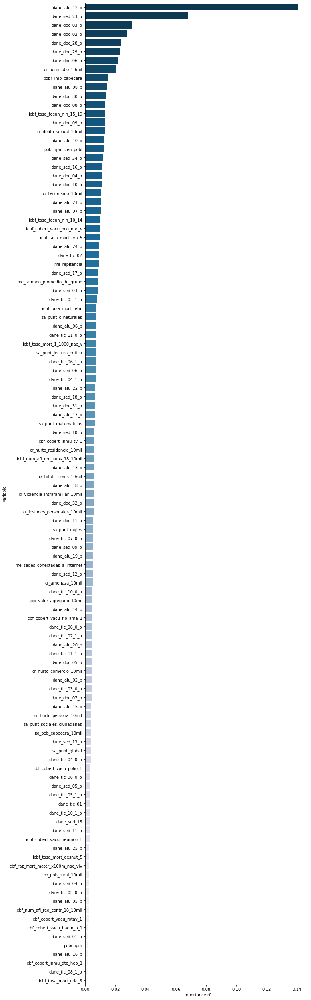

In [45]:
start_time = time.time()
X_all=DS_Alta_CB_Alta.drop(vars_drop, axis=1)

y=DS_Alta_CB_Alta['desertion_perc']

# define the model
rf_model = RandomForestRegressor(random_state=12345)
# fit the model
rf_model = rf_model.fit(X_all, y)
# get importance
 
features_imp_rf=dict(zip(X_all.columns, rf_model.feature_importances_))
features_imp_rf=pd.DataFrame.from_dict(features_imp_rf, orient='index').reset_index()
features_imp_rf.rename(columns={'index':'variable',0:'Importance rf'},inplace=True)
features_imp_rf=features_imp_rf.sort_values(by='Importance rf', ascending=False)
# features_imp_rf.to_clipboard(index=False,header=True)

plt.figure(figsize=(10,45))
ax = sns.barplot(x="Importance rf", y="variable", data=features_imp_rf,palette="PuBu_r")

# plt.figure(figsize=(5,7))
# ax = sns.barplot(x="Importance rf", y="variable", data=features_imp_rf[0:20],palette="PuBu_r")

print("Ejecución: %s seconds" % (time.time() - start_time))

To visualize the variables across the clusters, we plot some densities for each group.

In [46]:
var="me_tamano_promedio_de_grupo"


x0 = DS_Baja_CB_Baja[var]
x1 = DS_Baja_CB_Alta[var]
x2 = DS_Alta_CB_Baja[var]
x3 = DS_Alta_CB_Alta[var]

hist_data = [x0, x1, x2, x3]

group_labels = ['1_DS_Baja_CB_Baja', '2_DS_Baja_CB_Alta', '3_DS_Alta_CB_Baja' ,'4_DS_Alta_CB_Alta']
colors = ['#05386B', '#379683', '#5CDB95','#8EE4AF']

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot(hist_data, group_labels, show_hist=False, colors=colors,show_rug=False)

# Add title
#fig.update_layout(title_text='')
fig.show()

# Fit regression model to predict dropout rate

To understand how the dropout rate is affected by each of the variables we found relevant, we fit a Random Forest Regression model to interpreted and measure how the dropout rate is affected by adding one point to each explanatory variable.

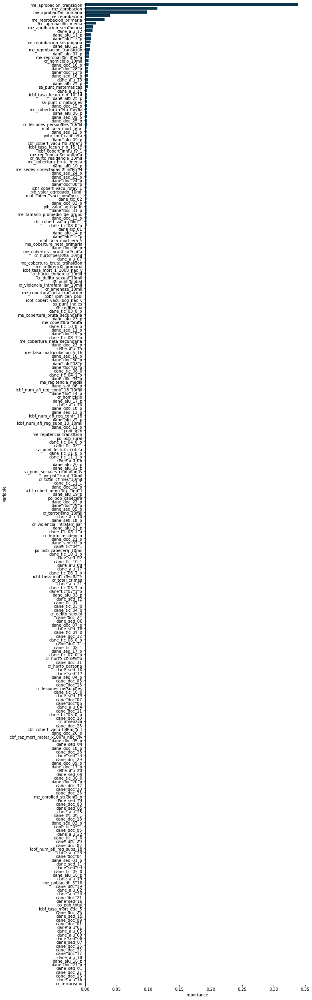

In [47]:
start_time = time.time()
#Define variable to be used in prediction
vars_drop = list(['name_dept', 'code_dept', 'name_municip', 'code_municip', 'year_cohort'
                  ,'desertion_perc', 'desertion_no', 'latitude', 'longitude', 'region','deser_perc_rank', 'cobertura_rank', 'desercion_rank'
                  ,'me_cobertura_neta'
                  ,'me_desercion_transicion','me_desercion_primaria','me_desercion_secundaria','me_desercion_media'
#Variables con alto missing (mas de 30%)
                  ,'dane_sed_20','dane_sed_20_p','dane_sed_14','icbf_num_nin_adol_desvinc'
#Variables de escalafon docente que se cambiaron por nueva agrupacion (Luis)
                  #,'dane_doc_12_p','dane_doc_13_p','dane_doc_14_p','dane_doc_15_p','dane_doc_16_p','dane_doc_17_p','dane_doc_18_p','dane_doc_19_p','dane_doc_20_p','dane_doc_21_p','dane_doc_22_p','dane_doc_23_p','dane_doc_24_p','dane_doc_25_p','dane_doc_26_p','dane_doc_27_p','dane_doc_12','dane_doc_13','dane_doc_14','dane_doc_15','dane_doc_16','dane_doc_17','dane_doc_18','dane_doc_19','dane_doc_20','dane_doc_21','dane_doc_22','dane_doc_23','dane_doc_24','dane_doc_25','dane_doc_26','dane_doc_27'
#Eliminadas por seleccion una a una:
                  #,'me_reprobacion','me_aprobacion','me_tasa_matriculacion_5_16','me_aprobacion_transicion','dane_alu_11','me_aprobacion_primaria','me_cobertura_bruta','po_pob_total','me_cobertura_neta_secundaria','me_cobertura_neta_primaria','me_aprobacion_secundaria','icbf_num_afi_reg_subs_18','me_aprobacion_media','me_cobertura_bruta_secundaria','dane_sed_10','po_pob_cabecera','me_cobertura_bruta_primaria','me_enrolled_students_n','dane_alu_11_p','dane_alu_09_p','me_poblacion_5_16','dane_sed_03','me_reprobacion_secundaria','dane_sed_08','me_cobertura_bruta_media','me_reprobacion_media','dane_sed_09','dane_alu_23','dane_alu_23_p','me_cobertura_neta_media','dane_alu_01','me_cobertura_neta_transicion','me_cobertura_bruta_transicion','dane_sed_02_p','dane_sed_11','dane_sed_02','me_reprobacion_primaria'

])

#Set the X matrix and Y label

X_all=mun_nomiss.drop(vars_drop, axis=1)

y=mun_nomiss['desertion_perc']

# Define the model
rf_model = RandomForestRegressor()
# Fit the model
rf_model.fit(X_all, y)

# get importance
features_imp=dict(zip(X_all.columns, rf_model.feature_importances_))
features_imp=pd.DataFrame.from_dict(features_imp, orient='index').reset_index()
features_imp.rename(columns={'index':'variable',0:'Importance'},inplace=True)
features_imp=features_imp.sort_values(by='Importance', ascending=False)
features_imp.to_clipboard(index=False,header=True)

plt.figure(figsize=(10,45))
ax = sns.barplot(x="Importance", y="variable", data=features_imp,palette="PuBu_r")

Now, we adjust the model to the data with the most relevant variables. First, we perform a cross-validated grid search to find the optimal parameters.

In [48]:
start_time = time.time()
# feature_cols = ['dane_alu_12','dane_alu_24_p','dane_alu_12_p','pobr_ipm_cen_pobl','sa_punt_c_naturales','dane_alu_13','cr_homicidio_10mil','sa_punt_matematicas','dane_alu_13_p','dane_tic_02']
# feature_cols = ['dane_alu_12','dane_alu_24_p','pobr_ipm_cen_pobl','dane_alu_12_p','dane_alu_13','dane_alu_13_p','sa_punt_c_naturales','cr_homicidio_10mil','me_tamano_promedio_de_grupo','dane_alu_15_p']
# feature_cols = ['me_desercion_secundaria','me_desercion_primaria','me_desercion_media','me_desercion_transicion','po_pob_total','cr_total_crimes']
feature_cols = ['me_aprobacion','me_reprobacion_secundaria','dane_alu_13_p','dane_alu_12','dane_alu_18_p','icbf_num_afi_reg_contr_18_10mil','icbf_tasa_fecun_nin_10_14','sa_punt_matematicas','me_tamano_promedio_de_grupo','dane_alu_19_p','dane_alu_12_p','icbf_tasa_fecun_nin_15_19','dane_alu_22_p','dane_alu_24_p','pobr_imp_cabecera','dane_doc_31_p','dane_tic_01','po_pob_rural_10mil','cr_hurto_persona_10mil']
# feature_cols = ['dane_alu_18_p','icbf_num_afi_reg_contr_18_10mil','icbf_tasa_fecun_nin_10_14','sa_punt_matematicas','me_tamano_promedio_de_grupo','dane_alu_19_p','dane_alu_12_p','icbf_tasa_fecun_nin_15_19','dane_alu_22_p','dane_alu_24_p','pobr_imp_cabecera','dane_doc_31_p','dane_tic_01','po_pob_rural_10mil','cr_hurto_persona_10mil']


X = X_all[feature_cols]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=12345)

rf1 = RandomForestRegressor(random_state=12345)
parameters = {'n_estimators':range(1,100,20),
    'max_depth':range(3,10,2),
    'min_samples_split':range(5,20,5),
    'min_samples_leaf':range(5,20,5)}

rf_grid = GridSearchCV(rf1,parameters,cv = 5,n_jobs = -1,verbose=False)
# rf_grid = RandomizedSearchCV(estimator=rf1, param_distributions=parameters, n_iter=500,cv=5,verbose=False,random_state=12345,n_jobs = -1)
rf_grid.fit(X_train,y_train)


print(rf_grid.best_score_)
print(rf_grid.best_params_)
print("Ejecución: %s seconds" % (time.time() - start_time))

0.6725153598709177
{'max_depth': 9, 'min_samples_leaf': 5, 'min_samples_split': 5, 'n_estimators': 81}
Ejecución: 80.89058017730713 seconds


Using the found parameters, we fit the regression model.

MAE train: 0.45655309629341684
MAE test: 0.6606905281719079
RMSE train: 0.6516396141760519
RMSE test: 0.9398142790777413
R-Squared train: 0.8572943415788443
R-Squared test: 0.6995600712934762


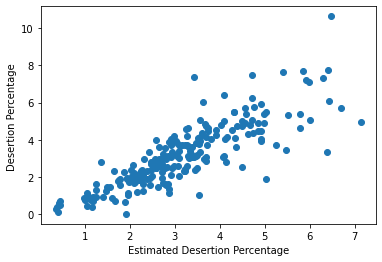

In [49]:
# rf_model = RandomForestRegressor(random_state=12345,max_depth=9,min_samples_leaf=12,min_samples_split=5,n_estimators=81)
rf_model = RandomForestRegressor(random_state=12345,max_depth=9,min_samples_leaf=5,min_samples_split=15,n_estimators=61)

rf_model = rf_model.fit(X_train,y_train)
y_pred_train = rf_model.predict(X_train)
y_pred_test = rf_model.predict(X_test)

MAPE_train=np.mean(np.abs((y_train - y_pred_train) / (y_train))) * 100
MAPE_test=np.mean(np.abs((y_test - y_pred_test) / (y_test))) * 100
MAE_train=metrics.mean_absolute_error(y_train, y_pred_train)
MAE_test=metrics.mean_absolute_error(y_test, y_pred_test)
RMSE_train=np.sqrt(metrics.mean_squared_error(y_train, y_pred_train))
RMSE_test=np.sqrt(metrics.mean_squared_error(y_test, y_pred_test))
R2_train=metrics.r2_score(y_train, y_pred_train)
R2_test=metrics.r2_score(y_test, y_pred_test)

#print("MAPE train:",MAPE_train)
#print("MAPE test:",MAPE_test)
print("MAE train:",MAE_train)
print("MAE test:",MAE_test)
print("RMSE train:",RMSE_train)
print("RMSE test:",RMSE_test)
print("R-Squared train:",R2_train)
print("R-Squared test:",R2_test)

plt.scatter(y_pred_test, y_test)
plt.xlabel("Estimated Desertion Percentage")
plt.ylabel("Desertion Percentage ")
plt.show()


Now, to find whats is the affectation of increasing each variable over the desertion dropout we follow the next procedure. First, we take the fitted values of the desertion rate in the whole data.

In [50]:
y_original=np.concatenate((y_pred_train, y_pred_test), axis=0)
mean_y_original=sum(y_original)/len(y_original)

Second, we sum one unit to each one of the attributes (one at a time) and keep constant the other variables. Later, we found the prediction of the model with the modified values. Finally, we compare how the prediction changes from the original predicted values to the modified values.

The same process is replicated for each one of the variables.

In [51]:
var="dane_alu_18_p"
X_pivot=X.copy()
X_pivot[var]=X_pivot[var]+0.01
y_pivot=rf_model.predict(X_pivot)
mean_y_pivot=sum(y_pivot)/len(y_pivot)
print("Media original: "+str(mean_y_original)+" - Media modificando "+var+": "+str(mean_y_pivot)+" - Diferencia:"+str(mean_y_pivot-mean_y_original))

Media original: 3.0680408063521143 - Media modificando dane_alu_18_p: 3.0680818904153444 - Diferencia:4.108406323011238e-05


In [52]:
var="icbf_num_afi_reg_contr_18_10mil"
X_pivot=X.copy()
X_pivot[var]=X_pivot[var]+1
y_pivot=rf_model.predict(X_pivot)
mean_y_pivot=sum(y_pivot)/len(y_pivot)
print("Media original: "+str(mean_y_original)+" - Media modificando "+var+": "+str(mean_y_pivot)+" - Diferencia:"+str(mean_y_pivot-mean_y_original))

Media original: 3.0680408063521143 - Media modificando icbf_num_afi_reg_contr_18_10mil: 3.068266420387509 - Diferencia:0.00022561403539489433


In [53]:
var="icbf_tasa_fecun_nin_10_14"
X_pivot=X.copy()
X_pivot[var]=X_pivot[var]+1
y_pivot=rf_model.predict(X_pivot)
mean_y_pivot=sum(y_pivot)/len(y_pivot)
print("Media original: "+str(mean_y_original)+" - Media modificando "+var+": "+str(mean_y_pivot)+" - Diferencia:"+str(mean_y_pivot-mean_y_original))

Media original: 3.0680408063521143 - Media modificando icbf_tasa_fecun_nin_10_14: 3.078576962799103 - Diferencia:0.010536156446988798


In [54]:
var="sa_punt_matematicas"
X_pivot=X.copy()
X_pivot[var]=X_pivot[var]+1
y_pivot=rf_model.predict(X_pivot)
mean_y_pivot=sum(y_pivot)/len(y_pivot)
print("Media original: "+str(mean_y_original)+" - Media modificando "+var+": "+str(mean_y_pivot)+" - Diferencia:"+str(mean_y_pivot-mean_y_original))

Media original: 3.0680408063521143 - Media modificando sa_punt_matematicas: 3.0572261740835267 - Diferencia:-0.010814632268587587


In [55]:
var="me_tamano_promedio_de_grupo"
X_pivot=X.copy()
X_pivot[var]=X_pivot[var]+1
y_pivot=rf_model.predict(X_pivot)
mean_y_pivot=sum(y_pivot)/len(y_pivot)
print("Media original: "+str(mean_y_original)+" - Media modificando "+var+": "+str(mean_y_pivot)+" - Diferencia:"+str(mean_y_pivot-mean_y_original))

Media original: 3.0680408063521143 - Media modificando me_tamano_promedio_de_grupo: 3.071470660997574 - Diferencia:0.003429854645459862


In [56]:
var="dane_alu_19_p"
X_pivot=X.copy()
X_pivot[var]=X_pivot[var]+0.01
y_pivot=rf_model.predict(X_pivot)
mean_y_pivot=sum(y_pivot)/len(y_pivot)
print("Media original: "+str(mean_y_original)+" - Media modificando "+var+": "+str(mean_y_pivot)+" - Diferencia:"+str(mean_y_pivot-mean_y_original))

Media original: 3.0680408063521143 - Media modificando dane_alu_19_p: 3.0693837487877045 - Diferencia:0.0013429424355901887


In [57]:
var="dane_alu_12_p"
X_pivot=X.copy()
X_pivot[var]=X_pivot[var]+0.01
y_pivot=rf_model.predict(X_pivot)
mean_y_pivot=sum(y_pivot)/len(y_pivot)
print("Media original: "+str(mean_y_original)+" - Media modificando "+var+": "+str(mean_y_pivot)+" - Diferencia:"+str(mean_y_pivot-mean_y_original))

Media original: 3.0680408063521143 - Media modificando dane_alu_12_p: 3.086688658330778 - Diferencia:0.0186478519786637


In [58]:
var="icbf_tasa_fecun_nin_15_19"
X_pivot=X.copy()
X_pivot[var]=X_pivot[var]+1
y_pivot=rf_model.predict(X_pivot)
mean_y_pivot=sum(y_pivot)/len(y_pivot)
print("Media original: "+str(mean_y_original)+" - Media modificando "+var+": "+str(mean_y_pivot)+" - Diferencia:"+str(mean_y_pivot-mean_y_original))

Media original: 3.0680408063521143 - Media modificando icbf_tasa_fecun_nin_15_19: 3.0688238150363905 - Diferencia:0.0007830086842761652


In [59]:
var="dane_alu_22_p"
X_pivot=X.copy()
X_pivot[var]=X_pivot[var]+0.01
y_pivot=rf_model.predict(X_pivot)
mean_y_pivot=sum(y_pivot)/len(y_pivot)
print("Media original: "+str(mean_y_original)+" - Media modificando "+var+": "+str(mean_y_pivot)+" - Diferencia:"+str(mean_y_pivot-mean_y_original))

Media original: 3.0680408063521143 - Media modificando dane_alu_22_p: 3.0697322751435068 - Diferencia:0.0016914687913924809


In [60]:
var="dane_alu_24_p"
X_pivot=X.copy()
X_pivot[var]=X_pivot[var]+0.01
y_pivot=rf_model.predict(X_pivot)
mean_y_pivot=sum(y_pivot)/len(y_pivot)
print("Media original: "+str(mean_y_original)+" - Media modificando "+var+": "+str(mean_y_pivot)+" - Diferencia:"+str(mean_y_pivot-mean_y_original))

Media original: 3.0680408063521143 - Media modificando dane_alu_24_p: 3.060672225725672 - Diferencia:-0.007368580626442078


In [61]:
var="pobr_imp_cabecera"
X_pivot=X.copy()
X_pivot[var]=X_pivot[var]+1
y_pivot=rf_model.predict(X_pivot)
mean_y_pivot=sum(y_pivot)/len(y_pivot)
print("Media original: "+str(mean_y_original)+" - Media modificando "+var+": "+str(mean_y_pivot)+" - Diferencia:"+str(mean_y_pivot-mean_y_original))

Media original: 3.0680408063521143 - Media modificando pobr_imp_cabecera: 3.0698028252524807 - Diferencia:0.0017620189003664244


In [62]:
var="dane_doc_31_p"
X_pivot=X.copy()
X_pivot[var]=X_pivot[var]+0.01
y_pivot=rf_model.predict(X_pivot)
mean_y_pivot=sum(y_pivot)/len(y_pivot)
print("Media original: "+str(mean_y_original)+" - Media modificando "+var+": "+str(mean_y_pivot)+" - Diferencia:"+str(mean_y_pivot-mean_y_original))

Media original: 3.0680408063521143 - Media modificando dane_doc_31_p: 3.0676448696791114 - Diferencia:-0.0003959366730028613


In [63]:
var="dane_tic_01"
X_pivot=X.copy()
X_pivot[var]=X_pivot[var]+1
y_pivot=rf_model.predict(X_pivot)
mean_y_pivot=sum(y_pivot)/len(y_pivot)
print("Media original: "+str(mean_y_original)+" - Media modificando "+var+": "+str(mean_y_pivot)+" - Diferencia:"+str(mean_y_pivot-mean_y_original))

Media original: 3.0680408063521143 - Media modificando dane_tic_01: 3.058486353829943 - Diferencia:-0.009554452522171353


In [64]:
var="po_pob_rural_10mil"
X_pivot=X.copy()
X_pivot[var]=X_pivot[var]+1
y_pivot=rf_model.predict(X_pivot)
mean_y_pivot=sum(y_pivot)/len(y_pivot)
print("Media original: "+str(mean_y_original)+" - Media modificando "+var+": "+str(mean_y_pivot)+" - Diferencia:"+str(mean_y_pivot-mean_y_original))

Media original: 3.0680408063521143 - Media modificando po_pob_rural_10mil: 3.0680484598618216 - Diferencia:7.653509707328254e-06


In [65]:
var="cr_hurto_persona_10mil"
X_pivot=X.copy()
X_pivot[var]=X_pivot[var]+1
y_pivot=rf_model.predict(X_pivot)
mean_y_pivot=sum(y_pivot)/len(y_pivot)
print("Media original: "+str(mean_y_original)+" - Media modificando "+var+": "+str(mean_y_pivot)+" - Diferencia:"+str(mean_y_pivot-mean_y_original))

Media original: 3.0680408063521143 - Media modificando cr_hurto_persona_10mil: 3.069240358410678 - Diferencia:0.001199552058563924


# We hope you had had a great time running and understanding each one of the steps followed by our team to understand the school dropout and the variables that are most correlated to eat in Colombia. Thanks for your time.